In [1]:
#@title Import packages
from pathlib import Path
import os
import numpy as np
import matplotlib.pyplot as plt

## Data Loading

In [2]:
# @title Data loading and imports

# set path for data
root = r'/mnt/d/Users/sunr/Janelia_Project/MCLabRotation/data_Zhong_et_al_2025'
root2 = r'/mnt/d/Users/sunr/Janelia_Project/MCLabRotation/data_newDeconv'
Path(root).mkdir(exist_ok=True)

beh_path = os.path.join(root, 'beh')
spk_path2 = os.path.join(root2, 'spk')
spk_path = os.path.join(root, 'spk')

## Get Neurons With Dprime

details:
- whether VRmove for the raw spk 
    - not in the cue time window plot since will show lick rate
    - already take during interplote to trial_pos mat
- baseline for the raw spk
    - 42-52 pos (gray space) spk of all even trials

dprime (only use odd trials; maybe try k-fold for detailed analysis)
- dp0: tuning to leaf1 or tuning to circle1 (using zscored spk, cue sound frame)
- dp1: tuning to early cue sound or late cue sound (using unnormalized trial_pos, 5-40 pos mean)
- reward neurons: dp0 > 90%, dp1 > 90%; non-reward neurons: dp0 < 10%, dp1< 10%

zscore and normalization:
- zscore the raw spk with all frames 
- normaliza the trial_pos mat with all trials (for raster plot (only use even trials))

In [3]:
from scipy.stats import zscore

def dprime(x1, x2):
    """x1,x2: neurons * frames """
    u1, u2 = np.nanmean(x1, 1), np.nanmean(x2, 1)
    sig1, sig2 = np.nanstd(x1, 1), np.nanstd(x2, 1)
    eps = 1e-9
    sig1[sig1 < eps] = eps
    sig2[sig2 < eps] = eps
    return 2 * (u1 - u2) / (sig1 + sig2)   

def normalization1(trial_pos, leaf_idx, circle_idx):
    """ mu: gray space mean activity as baseline
        std: stim1/2 + stim2/2
     """
    nneu, _, _= trial_pos.shape         
    # beh variables

    spk_resh = trial_pos.reshape((nneu,-1))

    corr_spk = trial_pos[:, :, :40].copy() # get activity in the texture area 
    eps = 1e-8
    # use nanmean/nanstd to tolerate NaNs
    u0 = np.nanmean(trial_pos[:, :, 42:52].reshape(nneu, -1), axis=1, keepdims=True)
    stim1_std = np.nanstd(corr_spk[:, :leaf_idx].reshape(nneu, -1),  axis=1, keepdims=True)
    stim2_std = np.nanstd(corr_spk[:, leaf_idx:(leaf_idx+circle_idx)].reshape(nneu, -1), axis=1, keepdims=True)
    den = stim1_std + stim2_std
    den = np.where(np.isfinite(den) & (den > 0), den, eps)
    spk_norm = (2 * (spk_resh - u0) / den).reshape(trial_pos.shape)

    #print('done normalization..')
    
    return spk_norm

def get_wall(trial_pos_block, beh, stim_id):
    wall_key = beh['UniqWalls'][beh['stim_id'] == stim_id][0]
    return trial_pos_block[wall_key]

def trial_pos_zscore(trial_pos, beh, reg_idx):
    leaf_raw = get_wall(trial_pos, beh, stim_id=2)[reg_idx]
    circle_raw = get_wall(trial_pos, beh, stim_id=0)[reg_idx]
    tp = np.concatenate([leaf_raw, circle_raw], axis=1)
    leaf_idx = leaf_raw.shape[1]
    circle_idx = circle_raw.shape[1]
    leaf = np.zeros(leaf_raw.shape)
    circle = np.zeros(circle_raw.shape)
    del leaf_raw, circle_raw
    N, T, P = tp.shape
    step_size = 2000 # decrease this if has small RAM
    i=0    
    while i <= N:
        Ni = tp[i:i+step_size,:,:].shape[0]
        tpi = tp[i:i+step_size,:,:].reshape(Ni, -1)
        tpz = zscore(tpi, axis=1, nan_policy='omit')
        #print(tp[i:i+step_size,:,:].shape)
        #tpz = normalization1(tp[i:i+step_size,:,:], leaf_idx, circle_idx)
        tpz = tpz.reshape(Ni, T, P)
        leaf[i:i+step_size,:,:] = tpz[:,:leaf_idx,:]
        circle[i:i+step_size,:,:] = tpz[:,leaf_idx:(circle_idx+leaf_idx),:]
        print(i) 
        i += step_size
    del tp, tpz  

    trial_pos = {}
    trial_pos[beh['UniqWalls'][beh['stim_id'] == 2][0]] = leaf
    trial_pos[beh['UniqWalls'][beh['stim_id'] == 0][0]] = circle
    
    return trial_pos 

def get_reward_nonreward_neuorns(trial_pos, spk, reg_idx, beh, odd_even=True):

    uniqW, WallN, isRew = beh['UniqWalls'], beh['WallName'], beh['isRew']
    stim_id = beh['stim_id']
    stim1 = WallN==uniqW[stim_id==2]
    stim2 = WallN==uniqW[stim_id==0]
    u_spk_stim1 = trial_pos[uniqW[stim_id==2][0]][:, :, 5:40].mean(axis=2) # take mean activity within texture area, starting from 5 (0.5 meter)

    SoundFr = beh['SoundFr'].astype(int)
    Pos = np.mod(beh['SoundDelPos'], beh['Corridor_Length']) # reward positions and cue positions are highly correlated in reward corridor
                                                               # since non-reward corridor doesn't have reward, so we use cue positions instead
    u_pos = Pos.mean()

    if odd_even:
        # total trials
        n_trials = len(stim1)   
        isodd_global = np.arange(1,n_trials+1) % 2 == 1

        stim1_odd = stim1 & isodd_global
        stim2_odd = stim2 & isodd_global

        stim1_idx = np.flatnonzero(stim1) # global -> local mapping
        Pos = Pos[stim1_idx]                       
        isRew = isRew[stim1_idx]                   
        isodd = isodd_global[stim1_idx]
        print(isodd.sum())         

        assert stim1_odd.sum() == isodd.sum(), "stim1 odd/even split error!"

        v_spk_stim1 = trial_pos[uniqW[stim_id==2][0]][:, isodd, :][:,:,:40].mean(axis=1)

        dp0 = dprime(spk[:, SoundFr[stim1_odd]], spk[:, SoundFr[stim2_odd]]) # equivilent to using all frames within the whole corridor
        dp1 = dprime(u_spk_stim1[:, (Pos >= u_pos) & isRew & isodd], u_spk_stim1[:, (Pos < u_pos) & isRew & isodd])   
        dp2 = dprime(v_spk_stim1[:, int(u_pos):], v_spk_stim1[:, :int(u_pos)])
    else:
        v_spk_stim1 = trial_pos[uniqW[stim_id==2][0]][:,:,:40].mean(axis=1)
        dp0 = dprime(spk[:, SoundFr[stim1]], spk[:, SoundFr[stim2]]) # equivilent to using all frames within the whole corridor
        dp1 = dprime(u_spk_stim1[:, (Pos >= u_pos) & isRew], u_spk_stim1[:, (Pos < u_pos) & isRew])
        dp2 = dprime(v_spk_stim1[:, int(u_pos):], v_spk_stim1[:, :int(u_pos)])
    
    thr1 = np.percentile(dp1[reg_idx], 90) # dprime at 95 percentile in aHV
    thr5 = np.percentile(dp1[reg_idx], 70) # dprime at 50 percentile in aHV
    thr21 = np.percentile(dp2[reg_idx], 100) # dprime at 80 percentile in aHV
    thr22 = np.percentile(dp2[reg_idx], 70) # dprime at 20 percentile in aHV
    thr3 = np.percentile(dp0[reg_idx], 90) # dprime at 80 percentile in aHV
    thr4 = np.percentile(dp0[reg_idx], 30) # dprime at 20 percentile in aHV
    sel_idx_stim1 = (dp0 >= thr3) & (dp1 >= thr1) & reg_idx
    sel_idx_stim2 = (dp0 <= thr4) & (dp2 <= thr21) & (dp2 >= thr22) & (dp1 >= thr5) & reg_idx

    print(f"Selected {sel_idx_stim1.sum()} reward neurons and {sel_idx_stim2.sum()} non-reward neurons")
 
    return sel_idx_stim1, sel_idx_stim2

def get_reward_nonreward_neuorns2(trial_pos, spk, reg_idx, beh, odd_even=True):

    uniqW, WallN, isRew = beh['UniqWalls'], beh['WallName'], beh['isRew']
    stim_id = beh['stim_id']
    stim1 = WallN==uniqW[stim_id==2]
    stim2 = WallN==uniqW[stim_id==0]
    u_spk_stim1 = trial_pos[uniqW[stim_id==2][0]][:, :, 5:40].mean(axis=2) # take mean activity within texture area, starting from 5 (0.5 meter)

    SoundFr = beh['SoundFr'].astype(int)
    Pos = np.mod(beh['SoundDelPos'], beh['Corridor_Length']) # reward positions and cue positions are highly correlated in reward corridor
                                                               # since non-reward corridor doesn't have reward, so we use cue positions instead
    u_pos = Pos.mean()

    if odd_even:
        # total trials
        n_trials = len(stim1)   
        isodd_global = np.arange(1,n_trials+1) % 2 == 1

        stim1_odd = stim1 & isodd_global
        stim2_odd = stim2 & isodd_global

        stim1_idx = np.flatnonzero(stim1) # global -> local mapping
        Pos = Pos[stim1_idx]                       
        isRew = isRew[stim1_idx]                   
        isodd = isodd_global[stim1_idx]        


        assert stim1_odd.sum() == isodd.sum(), "stim1 odd/even split error!"

        v_spk_stim1 = trial_pos[uniqW[stim_id==2][0]][:, isodd, :][:,:,:40].mean(axis=1)

        dp0 = dprime(spk[:, SoundFr[stim1_odd]], spk[:, SoundFr[stim2_odd]]) # equivilent to using all frames within the whole corridor
        dp1 = dprime(u_spk_stim1[:, (Pos >= u_pos) & isRew & isodd], u_spk_stim1[:, (Pos < u_pos) & isRew & isodd])   
        dp2 = dprime(v_spk_stim1[:, int(u_pos):], v_spk_stim1[:, :int(u_pos)])
    else:
        v_spk_stim1 = trial_pos[uniqW[stim_id==2][0]][:,:,:40].mean(axis=1)
        dp0 = dprime(spk[:, SoundFr[stim1]], spk[:, SoundFr[stim2]]) # equivilent to using all frames within the whole corridor
        dp1 = dprime(u_spk_stim1[:, (Pos >= u_pos) & isRew], u_spk_stim1[:, (Pos < u_pos) & isRew])
        dp2 = dprime(v_spk_stim1[:, int(u_pos):], v_spk_stim1[:, :int(u_pos)])
    
    thr1 = np.percentile(dp1[reg_idx], 80) # dprime at 95 percentile in aHV
    thr5 = np.percentile(dp1[reg_idx], 20) # dprime at 50 percentile in aHV
    #thr6 = np.percentile(dp1[reg_idx], 90) # dprime at 50 percentile in aHV
    thr21 = np.percentile(dp2[reg_idx], 100) # dprime at 80 percentile in aHV
    thr22 = np.percentile(dp2[reg_idx], 50) # dprime at 20 percentile in aHV
    thr3 = np.percentile(dp0[reg_idx], 80) # dprime at 80 percentile in aHV
    thr4 = np.percentile(dp0[reg_idx], 20) # dprime at 20 percentile in aHV
    #sel_idx_stim1 = (dp0 >= thr3) & (dp1 >= thr1) & (dp2 <= thr22) & reg_idx
    #sel_idx_stim2 = (dp0 <= thr4) & (dp2 <= thr21) & (dp2 >= thr22) & (dp1 >= thr5) & reg_idx
    #sel_idx_stim2 = (dp0 <= thr4) & (dp1 >= thr5) & (dp1 <= thr6) & reg_idx
    print(thr3, thr4, thr1, thr5)
    sel_idx_stim1 = (dp0[reg_idx] >= thr3) & (dp1[reg_idx] >= thr1)
    sel_idx_stim2 = (dp0[reg_idx] <= thr4) & (dp1[reg_idx] <= thr5) 
    print(f"Selected {sel_idx_stim1.sum()} reward neurons and {sel_idx_stim2.sum()} non-reward neurons")
 
    return sel_idx_stim1, sel_idx_stim2


In [ ]:
from traitlets import All


animals_info = {'VR2':[['2021_03_20_1'], ['2021_04_06_1'], ['2021_04_11_1']]}
sel_idx_stim1_all = {'All':[], 'V1':[], 'mHV':[], 'lHV':[], 'aHV':[]}
sel_idx_stim2_all = {'All':[], 'V1':[], 'mHV':[], 'lHV':[], 'aHV':[]}
for animal in animals_info.keys():
    print(f'Processing {animal} ...')

    #bef1_spk = np.load(os.path.join(spk_path2, f'{animal}_{animals_info[animal][0][0]}_neural_data.npy'), allow_pickle=1).item()['spks']
    #bef1_spk = np.vstack(bef1_spk)
    #bef1_spk = zscore(bef1_spk, axis=1)
    #bef1_trial_pos, _, bef1_reg_idx, _, _, _, bef1_beh = np.load(os.path.join(root2, 'variable', f'{animal}_bef1_results.npy'), allow_pickle=1).tolist()
    print('loaded bef1 data')
    for jar in ['All', 'V1', 'mHV', 'lHV', 'aHV']:
        print(f'Processing {jar} ...')
        sel_idx_stim1, sel_idx_stim2 = get_reward_nonreward_neuorns2(bef1_trial_pos, bef1_spk, bef1_reg_idx[jar], bef1_beh)
        sel_idx_stim1_all[jar].append(sel_idx_stim1)
        sel_idx_stim2_all[jar].append(sel_idx_stim2)

    #aft1_trial_pos, _, aft1_reg_idx, _, _, _, aft1_beh = np.load(os.path.join(root2, 'variable', f'{animal}_aft1_results.npy'), allow_pickle=1).tolist()
    #aft1_spk = np.load(os.path.join(spk_path2, f'{animal}_{animals_info[animal][1][0]}_neural_data.npy'), allow_pickle=1).item()['spks']
    #aft1_spk = np.vstack(aft1_spk)
    #aft1_spk = zscore(aft1_spk, axis=1)
    print('loaded aft1 data')
    for jar in ['All', 'V1', 'mHV', 'lHV', 'aHV']:
        print(f'Processing {jar} ...')
        sel_idx_stim1, sel_idx_stim2 = get_reward_nonreward_neuorns2(aft1_trial_pos, aft1_spk, aft1_reg_idx[jar], aft1_beh)
        sel_idx_stim1_all[jar].append(sel_idx_stim1)
        sel_idx_stim2_all[jar].append(sel_idx_stim2)

    #test1_trial_pos, _, test1_reg_idx, _, _, _, test1_beh = np.load(os.path.join(root2, 'variable', f'{animal}_test1_results.npy'), allow_pickle=1).tolist()
    #test1_spk = np.load(os.path.join(spk_path2, f'{animal}_{animals_info[animal][2][0]}_neural_data.npy'), allow_pickle=1).item()['spks']
    #test1_spk = np.vstack(test1_spk)
    #test1_spk = zscore(test1_spk, axis=1)
    print('loaded test1 data')
    for jar in ['All', 'V1', 'mHV', 'lHV', 'aHV']:
        print(f'Processing {jar} ...')
        sel_idx_stim1, sel_idx_stim2 = get_reward_nonreward_neuorns2(test1_trial_pos, test1_spk, test1_reg_idx[jar], test1_beh)
        sel_idx_stim1_all[jar].append(sel_idx_stim1)
        sel_idx_stim2_all[jar].append(sel_idx_stim2)

Processing VR2 ...
loaded bef1 data
Processing All ...
0.24513216 -0.22509268 0.1582932048325791 -0.1972468011501764
Selected 3196 reward neurons and 3142 non-reward neurons
Processing V1 ...
0.32005236 -0.26377514 0.15808040367924187 -0.18407891186328185
Selected 1266 reward neurons and 1231 non-reward neurons
Processing mHV ...
0.23218672 -0.22954306 0.15440334247044785 -0.21184025957616057
Selected 504 reward neurons and 468 non-reward neurons
Processing lHV ...
0.28806028 -0.25555232 0.15102858703771543 -0.18475592580298714
Selected 395 reward neurons and 358 non-reward neurons
Processing aHV ...
0.17201841 -0.18071255 0.16351659863533974 -0.21192529890687511
Selected 456 reward neurons and 443 non-reward neurons
loaded aft1 data
Processing All ...


In [28]:
aft1_z_tp = trial_pos_zscore(aft1_trial_pos, aft1_beh, aft1_reg_idx['All'])
test1_z_tp = trial_pos_zscore(test1_trial_pos, test1_beh, test1_reg_idx['All'])
bef1_z_tp = trial_pos_zscore(bef1_trial_pos, bef1_beh, bef1_reg_idx['All'])

0
2000
4000
6000
8000
10000
12000
14000
16000
18000
20000
22000
24000
26000
28000
30000
32000
34000
36000
38000
40000
42000
44000
46000
48000
50000
52000
54000
56000
58000
60000
62000
64000
66000
68000
70000
0
2000
4000
6000
8000
10000
12000
14000
16000
18000
20000
22000
24000
26000
28000
30000
32000
34000
36000
38000
40000
42000
44000
46000
48000
50000
52000
54000
56000
58000
60000
62000
64000
66000
68000
70000
72000
74000
76000
0
2000
4000
6000
8000
10000
12000
14000
16000
18000
20000
22000
24000
26000
28000
30000
32000
34000
36000
38000
40000
42000
44000
46000
48000
50000
52000
54000
56000
58000
60000
62000
64000
66000
68000
70000
72000
74000
76000
78000
80000


In [ ]:
unsup_animals_info = {
    'DR10': [['2022_07_12_1'], ['2022_07_19_1'], ['2022_07_21_1']],
    'TX88': [['2022_06_13_2'], ['2022_06_17_2'], ['2022_06_20_1']],
    'TX105': [['2022_10_08_2'], ['2022_10_19_2'], ['2022_10_21_1']],
    'TX123': [['2023_12_21_1'], ['2024_01_02_1'], ['2024_01_03_1']],
    'DR15': [['2022_10_09_1'], ['2022_10_19_1'], ['2022_10_20_1']],
    'TX119': [['2023_12_14_1'], ['2023_12_23_1'], ['2023_12_24_1']],
    'TX83': [['2022_08_17_1'], ['2022_08_29_1'], ['2022_08_31_1']]
}

sup_animals_info ={
    'TX108':[['2023_03_13_1'], ['2023_03_22_1'], ['2023_03_25_1']],
    'TX60':[['2021_04_10_1'], ['2021_05_04_1'], ['2021_06_07_1']],
    'VR2':[['2021_03_20_1'], ['2021_04_06_1'], ['2021_04_11_1']],
    'TX109':[['2023_03_27_1'], ['2023_04_07_1'], ['2023_04_18_1']]
}

sel_idx_stim1_all = {animal: {'All':[], 'V1':[], 'mHV':[], 'lHV':[], 'aHV':[]} for animal in list(sup_animals_info.keys()) + list(unsup_animals_info.keys())}
sel_idx_stim2_all = {animal: {'All':[], 'V1':[], 'mHV':[], 'lHV':[], 'aHV':[]} for animal in list(sup_animals_info.keys()) + list(unsup_animals_info.keys())}
for animal_type, animals in zip(['sup', 'unsup'], [sup_animals_info, unsup_animals_info]):
    for animal in animals.keys():
        print(f'Processing {animal} ...')
        bef1_spk = np.load(os.path.join(spk_path2, f'{animal}_{animals[animal][0][0]}_neural_data.npy'), allow_pickle=1).item()['spks']
        bef1_spk = np.vstack(bef1_spk)
        bef1_spk = zscore(bef1_spk, axis=1)
        bef1_trial_pos, _, bef1_reg_idx, _, _, _, bef1_beh = np.load(os.path.join(root2, 'variable', f'{animal}_bef1_results.npy'), allow_pickle=1).tolist()
        print('loaded bef1 data')
        for jar in ['All', 'V1', 'mHV', 'lHV', 'aHV']:
            print(f'Processing {jar} ...')
            sel_idx_stim1, sel_idx_stim2 = get_reward_nonreward_neuorns2(bef1_trial_pos, bef1_spk, bef1_reg_idx[jar], bef1_beh)
            sel_idx_stim1_all[animal][jar].append(sel_idx_stim1)
            sel_idx_stim2_all[animal][jar].append(sel_idx_stim2)
        del bef1_spk, bef1_trial_pos, bef1_reg_idx, bef1_beh

        aft1_trial_pos, _, aft1_reg_idx, _, _, _, aft1_beh = np.load(os.path.join(root2, 'variable', f'{animal}_aft1_results.npy'), allow_pickle=1).tolist()
        aft1_spk = np.load(os.path.join(spk_path2, f'{animal}_{animals[animal][1][0]}_neural_data.npy'), allow_pickle=1).item()['spks']
        aft1_spk = np.vstack(aft1_spk)
        aft1_spk = zscore(aft1_spk, axis=1)
        print('loaded aft1 data')
        for jar in ['All', 'V1', 'mHV', 'lHV', 'aHV']:
            print(f'Processing {jar} ...')
            sel_idx_stim1, sel_idx_stim2 = get_reward_nonreward_neuorns2(aft1_trial_pos, aft1_spk, aft1_reg_idx[jar], aft1_beh)
            sel_idx_stim1_all[animal][jar].append(sel_idx_stim1)
            sel_idx_stim2_all[animal][jar].append(sel_idx_stim2)
        del aft1_spk, aft1_trial_pos, aft1_reg_idx, aft1_beh

        test1_trial_pos, _, test1_reg_idx, _, _, _, test1_beh = np.load(os.path.join(root2, 'variable', f'{animal}_test1_results.npy'), allow_pickle=1).tolist()
        test1_spk = np.load(os.path.join(spk_path2, f'{animal}_{animals[animal][2][0]}_neural_data.npy'), allow_pickle=1).item()['spks']
        test1_spk = np.vstack(test1_spk)
        test1_spk = zscore(test1_spk, axis=1)
        print('loaded test1 data')
        for jar in ['All', 'V1', 'mHV', 'lHV', 'aHV']:
            print(f'Processing {jar} ...')  
            sel_idx_stim1, sel_idx_stim2 = get_reward_nonreward_neuorns2(test1_trial_pos, test1_spk, test1_reg_idx[jar], test1_beh)
            sel_idx_stim1_all[animal][jar].append(sel_idx_stim1)
            sel_idx_stim2_all[animal][jar].append(sel_idx_stim2)
        del test1_spk, test1_trial_pos, test1_reg_idx, test1_beh

Processing TX108 ...
loaded bef1 data
Processing All ...
0.25628662 -0.24041663 0.24531825858176834 -0.2361664599307032
Selected 3560 reward neurons and 3280 non-reward neurons
Processing V1 ...
0.26248184 -0.25109214 0.25710543696427096 -0.2318997742169705
Selected 1283 reward neurons and 1197 non-reward neurons
Processing mHV ...
0.26208392 -0.2432728 0.23238971759880786 -0.23687953071764922
Selected 1063 reward neurons and 994 non-reward neurons
Processing lHV ...
0.28076607 -0.25244093 0.26001372188658345 -0.24614338259531007
Selected 438 reward neurons and 393 non-reward neurons
Processing aHV ...
0.22399494 -0.21227865 0.23107012353221124 -0.2370385190832045
Selected 482 reward neurons and 450 non-reward neurons
loaded aft1 data
Processing All ...
0.3361121 -0.34883088 0.2881884757954167 -0.41459728007510654
Selected 5797 reward neurons and 4775 non-reward neurons
Processing V1 ...
0.31096792 -0.36022827 0.24882454131156964 -0.4246543730322506
Selected 1956 reward neurons and 157

NameError: name 'aft1' is not defined

### Raster Plot of Selected Neurons

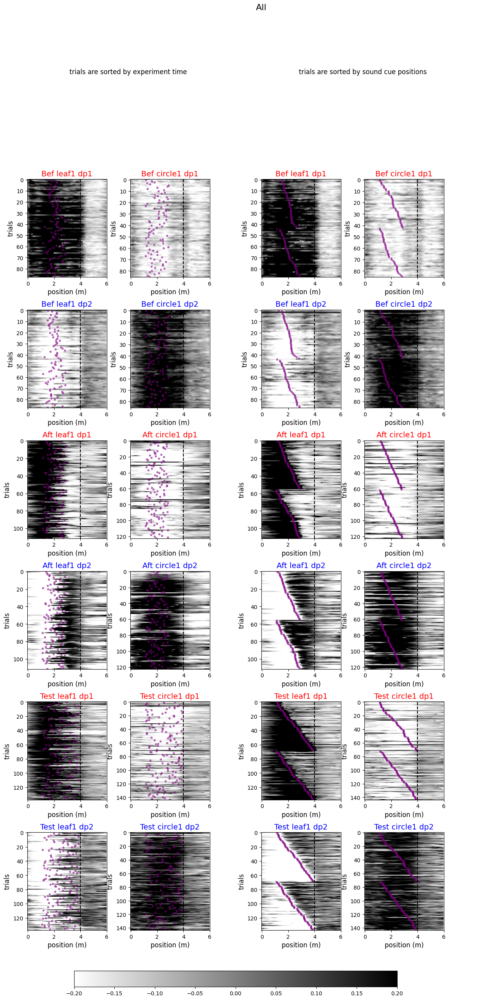

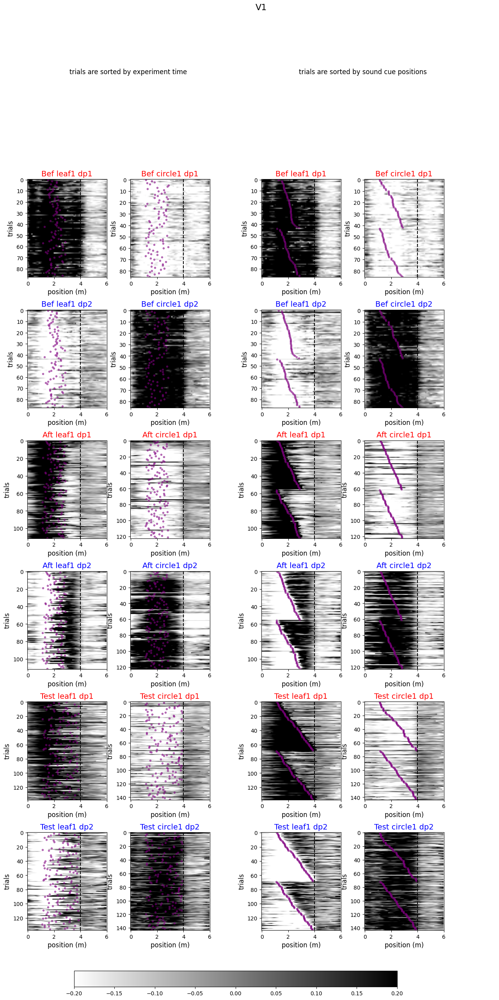

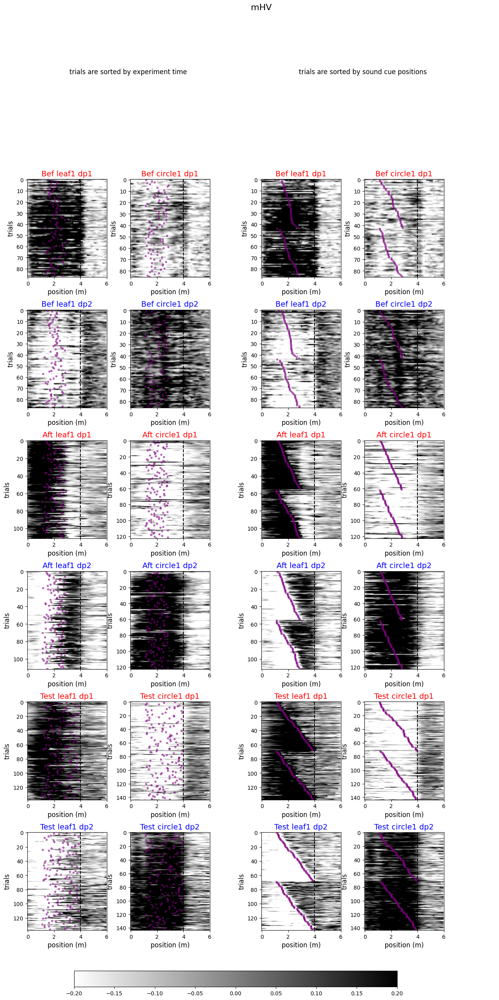

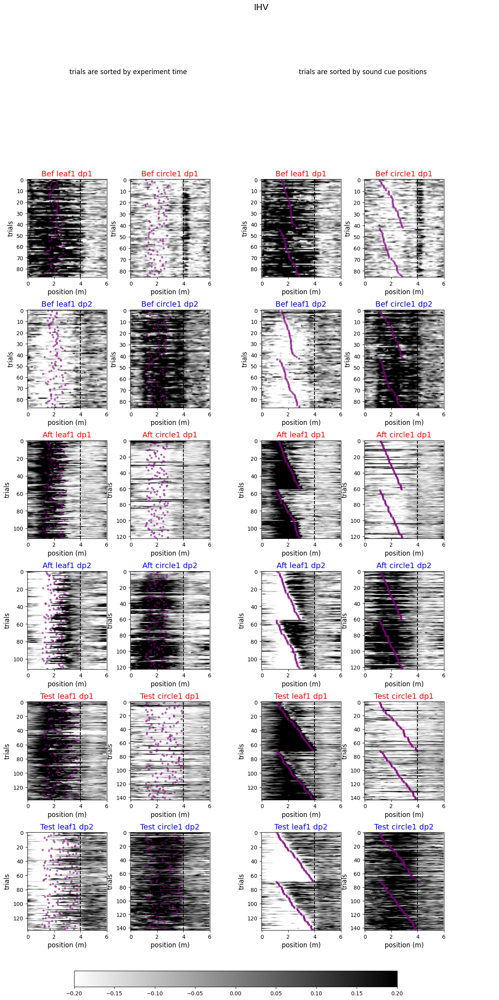

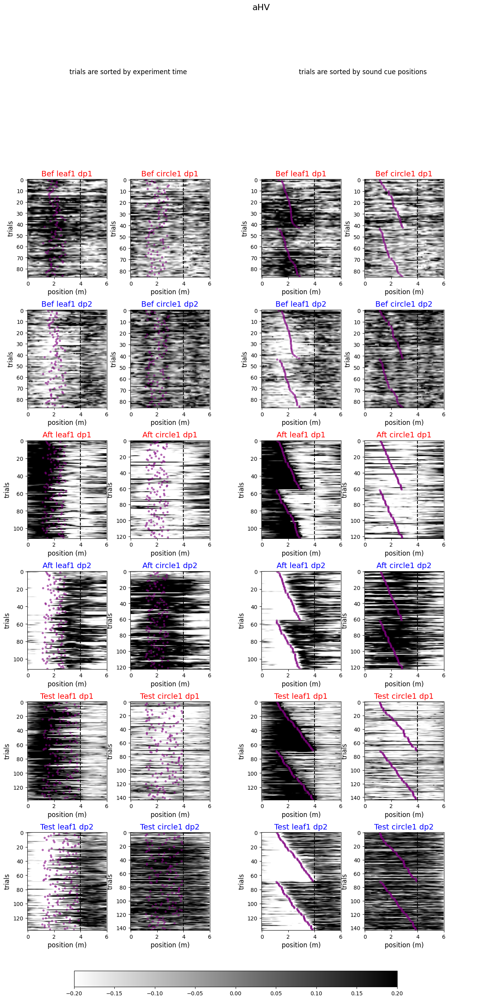

In [324]:
from matplotlib.pyplot import gray


aft1_SoundPos = aft1_beh['SoundPos']
bef1_SoundPos = bef1_beh['SoundPos']
test1_SoundPos = test1_beh['SoundPos']

# @title Plot activity as trials by positions (example neuron)
def im_plot(ax, spk_in, cue_pos, sort_cue=0):
    if not np.isnan(cue_pos).all():
        sort_ind = np.argsort(cue_pos) if sort_cue else np.arange(len(cue_pos)).astype(int)
    else:
        sort_ind = np.arange(len(cue_pos)).astype(int)
    ax.imshow(spk_in[sort_ind], cmap='gray_r', vmin=-0.1, vmax=0.3)
    #ax.imshow(spk_in[sort_ind], cmap='gray_r')
    ax.plot(cue_pos[sort_ind], np.arange(len(cue_pos)), marker='.',color='purple', ls='None', alpha=0.5)
    ax.vlines(40, *ax.get_ylim(), color='k', ls='dashed')
    ax.set_aspect('auto')
    ax.set_ylabel('trials')
    ax.set_xlabel('position (m)')
    ax.set_xticks([0, 20, 40, 60], [0, 2, 4 ,6])

def im_plot(ax, spk_in, cue_pos, sort_cue=0, vmin=-0.2, vmax=0.2):
    n = len(cue_pos)
    assert spk_in.shape[0] == n, "spk_in rows must match cue_pos length"

    # Fold indices: early, middle, late
    folds = np.array_split(np.arange(n, dtype=int), 2)

    ordered = []
    for fold in folds:
        if not sort_cue or fold.size == 0 or np.isnan(cue_pos[fold]).all():
            ordered.append(fold)
        else:
            # Stable sort so equal/NaN preserve original order; NaN go to the end by default
            local_order = np.argsort(cue_pos[fold], kind='mergesort')
            ordered.append(fold[local_order])

    sort_ind = np.concatenate(ordered) if ordered else np.arange(n, dtype=int)

    ax.imshow(spk_in[sort_ind], cmap='gray_r', vmin=vmin, vmax=vmax)
    ax.plot(cue_pos[sort_ind], np.arange(n), marker='.', color='purple', ls='None', alpha=0.5)
    ax.vlines(40, *ax.get_ylim(), color='k', ls='dashed')

    # (optional) faint lines to show fold boundaries
    b1 = len(folds[0]); b2 = b1 + len(folds[1])
    for y in (b1, b2):
        if 0 < y < n:
            ax.hlines(y - 0.5, *ax.get_xlim(), colors='k', linestyles='dotted', linewidth=0.8, alpha=0.4)

    ax.set_aspect('auto')
    ax.set_ylabel('trials')
    ax.set_xlabel('position (m)')
    ax.set_xticks([0, 20, 40, 60], [0, 2, 4, 6])

for jar in ['All', 'V1', 'mHV', 'lHV', jar]:

    fig = plt.figure(figsize=(12, 9))
    axes = [fig.add_axes([0, 1.2, 0.17, 0.3]), fig.add_axes([0.22, 1.2, 0.17, 0.3]), fig.add_axes([0.5, 1.2, 0.17, 0.3]), fig.add_axes([0.72, 1.2, 0.17, 0.3]),
        fig.add_axes([0, 0.8, 0.17, 0.3]), fig.add_axes([0.22, 0.8, 0.17, 0.3]), fig.add_axes([0.5, 0.8, 0.17, 0.3]), fig.add_axes([0.72, 0.8, 0.17, 0.3]),
        fig.add_axes([0, 0.4, 0.17, 0.3]), fig.add_axes([0.22, 0.4, 0.17, 0.3]), fig.add_axes([0.5, 0.4, 0.17, 0.3]), fig.add_axes([0.72, 0.4, 0.17, 0.3]),
        fig.add_axes([0, 0.0, 0.17, 0.3]), fig.add_axes([0.22, 0.0, 0.17, 0.3]), fig.add_axes([0.5, 0.0, 0.17, 0.3]), fig.add_axes([0.72, 0.0, 0.17, 0.3]),
        fig.add_axes([0, -0.4, 0.17, 0.3]), fig.add_axes([0.22, -0.4, 0.17, 0.3]), fig.add_axes([0.5, -0.4, 0.17, 0.3]), fig.add_axes([0.72, -0.4, 0.17, 0.3]),
        fig.add_axes([0, -0.8, 0.17, 0.3]), fig.add_axes([0.22, -0.8, 0.17, 0.3]), fig.add_axes([0.5, -0.8, 0.17, 0.3]), fig.add_axes([0.72, -0.8, 0.17, 0.3])]

    # bef1
    n_trials = bef1_beh['ntrials']  
    uniqW, WallN, isRew = bef1_beh['UniqWalls'], bef1_beh['WallName'], bef1_beh['isRew']
    stim_id = bef1_beh['stim_id']
    stim1 = WallN==uniqW[stim_id==2]
    stim2 = WallN==uniqW[stim_id==0]
    iseven_global = np.arange(n_trials) % 2 == 0

    stim1_idx = np.flatnonzero(stim1) # global -> local mapping   
    stim2_idx = np.flatnonzero(stim2)          
    iseven_stim1 = iseven_global[stim1_idx]   
    iseven_stim2 = iseven_global[stim2_idx] 

    neurons_pick = sel_idx_stim1_all[jar][0]
    neurons_pick2 = sel_idx_stim2_all[jar][0]
    #a_z = bef1_trial_pos[bef1_beh['UniqWalls'][bef1_beh['stim_id']==2][0]]
    #b_z = bef1_trial_pos[bef1_beh['UniqWalls'][bef1_beh['stim_id']==0][0]]
    a_z = bef1_z_tp[bef1_beh['UniqWalls'][bef1_beh['stim_id']==2][0]][bef1_reg_idx[jar]]
    b_z = bef1_z_tp[bef1_beh['UniqWalls'][bef1_beh['stim_id']==0][0]][bef1_reg_idx[jar]]

    sp_even1 = stim1 & iseven_global
    sp_even2 = stim2 & iseven_global

    im_plot(axes[0], a_z[neurons_pick][:,iseven_stim1].mean(axis=0), bef1_SoundPos[sp_even1], sort_cue=0)
    axes[0].set_title('Bef leaf1 dp1', color='r')   
    im_plot(axes[1], b_z[neurons_pick][:,iseven_stim2].mean(axis=0), bef1_SoundPos[sp_even2], sort_cue=0)
    axes[1].set_title('Bef circle1 dp1', color='r')
    im_plot(axes[2], a_z[neurons_pick][:,iseven_stim1].mean(axis=0), bef1_SoundPos[sp_even1], sort_cue=1)
    axes[2].set_title('Bef leaf1 dp1', color='r')
    im_plot(axes[3], b_z[neurons_pick][:,iseven_stim2].mean(axis=0), bef1_SoundPos[sp_even2], sort_cue=1)
    axes[3].set_title('Bef circle1 dp1', color='r')

    im_plot(axes[4], a_z[neurons_pick2][:,iseven_stim1].mean(axis=0), bef1_SoundPos[sp_even1], sort_cue=0)
    axes[4].set_title('Bef leaf1 dp2', color='b')   
    im_plot(axes[5], b_z[neurons_pick2][:,iseven_stim2].mean(axis=0), bef1_SoundPos[sp_even2], sort_cue=0)
    axes[5].set_title('Bef circle1 dp2', color='b')
    im_plot(axes[6], a_z[neurons_pick2][:,iseven_stim1].mean(axis=0), bef1_SoundPos[sp_even1], sort_cue=1)
    axes[6].set_title('Bef leaf1 dp2', color='b')
    im_plot(axes[7], b_z[neurons_pick2][:,iseven_stim2].mean(axis=0), bef1_SoundPos[sp_even2], sort_cue=1)
    axes[7].set_title('Bef circle1 dp2', color='b')


    # aft1
    n_trials = aft1_beh['ntrials']  
    uniqW, WallN, isRew = aft1_beh['UniqWalls'], aft1_beh['WallName'], aft1_beh['isRew']
    stim_id = aft1_beh['stim_id']
    stim1 = WallN==uniqW[stim_id==2]
    stim2 = WallN==uniqW[stim_id==0]
    iseven_global = np.arange(1,n_trials+1) % 2 == 0

    stim1_idx = np.flatnonzero(stim1) # global -> local mapping   
    stim2_idx = np.flatnonzero(stim2)          
    iseven_stim1 = iseven_global[stim1_idx]   
    iseven_stim2 = iseven_global[stim2_idx] 

    neurons_pick = sel_idx_stim1_all[jar][1]
    neurons_pick2 = sel_idx_stim2_all[jar][1]
    #a_z = aft1_trial_pos[aft1_beh['UniqWalls'][aft1_beh['stim_id']==2][0]]
    #b_z = aft1_trial_pos[aft1_beh['UniqWalls'][aft1_beh['stim_id']==0][0]]
    a_z = aft1_z_tp[aft1_beh['UniqWalls'][aft1_beh['stim_id']==2][0]][aft1_reg_idx[jar]]
    b_z = aft1_z_tp[aft1_beh['UniqWalls'][aft1_beh['stim_id']==0][0]][aft1_reg_idx[jar]]

    sp_even1 = stim1 & iseven_global
    sp_even2 = stim2 & iseven_global

    # trials are sorted by experiment time
    im_plot(axes[8], a_z[neurons_pick][:,iseven_stim1].mean(axis=0), aft1_SoundPos[sp_even1], sort_cue=0)
    axes[8].set_title('Aft leaf1 dp1', color='r')
    im_plot(axes[9], b_z[neurons_pick][:,iseven_stim2].mean(axis=0), aft1_SoundPos[sp_even2], sort_cue=0)
    axes[9].set_title('Aft circle1 dp1', color='r')
    # trials are sorted by sound cue positions
    im_plot(axes[10], a_z[neurons_pick][:,iseven_stim1].mean(axis=0), aft1_SoundPos[sp_even1], sort_cue=1)
    axes[10].set_title('Aft leaf1 dp1', color='r')
    im_plot(axes[11], b_z[neurons_pick][:,iseven_stim2].mean(axis=0), aft1_SoundPos[sp_even2], sort_cue=1)
    axes[11].set_title('Aft circle1 dp1', color='r')

    im_plot(axes[12], a_z[neurons_pick2][:,iseven_stim1].mean(axis=0), aft1_SoundPos[sp_even1], sort_cue=0)
    axes[12].set_title('Aft leaf1 dp2', color='b')
    im_plot(axes[13], b_z[neurons_pick2][:,iseven_stim2].mean(axis=0), aft1_SoundPos[sp_even2], sort_cue=0)
    axes[13].set_title('Aft circle1 dp2', color='b')
    im_plot(axes[14], a_z[neurons_pick2][:,iseven_stim1].mean(axis=0), aft1_SoundPos[sp_even1], sort_cue=1)
    axes[14].set_title('Aft leaf1 dp2', color='b')
    im_plot(axes[15], b_z[neurons_pick2][:,iseven_stim2].mean(axis=0), aft1_SoundPos[sp_even2], sort_cue=1)
    axes[15].set_title('Aft circle1 dp2', color='b')


    # test1
    n_trials = test1_beh['ntrials']  
    uniqW, WallN, isRew = test1_beh['UniqWalls'], test1_beh['WallName'], test1_beh['isRew']
    stim_id = test1_beh['stim_id']
    stim1 = WallN==uniqW[stim_id==2]
    stim2 = WallN==uniqW[stim_id==0]
    iseven_global = np.arange(n_trials) % 2 == 0

    stim1_idx = np.flatnonzero(stim1) # global -> local mapping   
    stim2_idx = np.flatnonzero(stim2)          
    iseven_stim1 = iseven_global[stim1_idx]   
    iseven_stim2 = iseven_global[stim2_idx] 

    neurons_pick = sel_idx_stim1_all[jar][2]
    neurons_pick2 = sel_idx_stim2_all[jar][2]
    #a_z = test1_trial_pos[test1_beh['UniqWalls'][test1_beh['stim_id']==2][0]]
    #b_z = test1_trial_pos[test1_beh['UniqWalls'][test1_beh['stim_id']==0][0]]
    a_z = test1_z_tp[test1_beh['UniqWalls'][test1_beh['stim_id']==2][0]][test1_reg_idx[jar]]   
    b_z = test1_z_tp[test1_beh['UniqWalls'][test1_beh['stim_id']==0][0]][test1_reg_idx[jar]]

    sp_even1 = stim1 & iseven_global
    sp_even2 = stim2 & iseven_global

    im_plot(axes[16], a_z[neurons_pick][:,iseven_stim1].mean(axis=0), test1_SoundPos[sp_even1], sort_cue=0)
    axes[16].set_title('Test leaf1 dp1', color='r') 
    im_plot(axes[17], b_z[neurons_pick][:,iseven_stim2].mean(axis=0), test1_SoundPos[sp_even2], sort_cue=0)
    axes[17].set_title('Test circle1 dp1', color='r')
    im_plot(axes[18], a_z[neurons_pick][:,iseven_stim1].mean(axis=0), test1_SoundPos[sp_even1], sort_cue=1)
    axes[18].set_title('Test leaf1 dp1', color='r')
    im_plot(axes[19], b_z[neurons_pick][:,iseven_stim2].mean(axis=0), test1_SoundPos[sp_even2], sort_cue=1)
    axes[19].set_title('Test circle1 dp1', color='r')   

    im_plot(axes[20], a_z[neurons_pick2][:,iseven_stim1].mean(axis=0), test1_SoundPos[sp_even1], sort_cue=0)
    axes[20].set_title('Test leaf1 dp2', color='b')   
    im_plot(axes[21], b_z[neurons_pick2][:,iseven_stim2].mean(axis=0), test1_SoundPos[sp_even2], sort_cue=0)
    axes[21].set_title('Test circle1 dp2', color='b')
    im_plot(axes[22], a_z[neurons_pick2][:,iseven_stim1].mean(axis=0), test1_SoundPos[sp_even1], sort_cue=1)
    axes[22].set_title('Test leaf1 dp2', color='b')
    im_plot(axes[23], b_z[neurons_pick2][:,iseven_stim2].mean(axis=0), test1_SoundPos[sp_even2], sort_cue=1)
    axes[23].set_title('Test circle1 dp2', color='b')


    text_ax = fig.add_axes([0, 0, 1, 1])
    text_ax.axis('off')
    text_ax.text(0.09, 1.55, 'trials are sorted by experiment time')
    text_ax.text(0.58, 1.55, 'trials are sorted by sound cue positions')
    plt.colorbar(axes[0].images[0], ax=axes, orientation='horizontal', fraction=0.02, pad=0.05)
    plt.suptitle(f'{jar}', fontsize=16, y=1.65)
    plt.show()

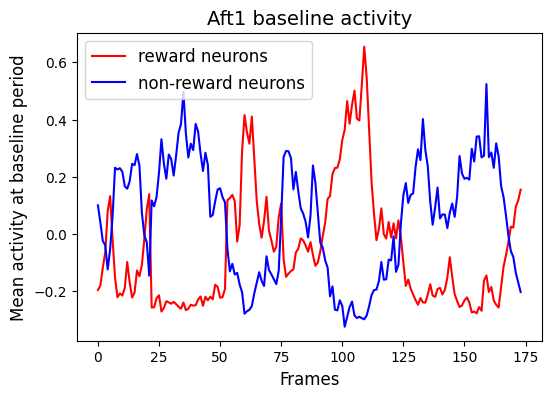

In [302]:
grayFr = (aft1_beh['ft_PosCum']/60 <52) & (aft1_beh['ft_PosCum']/60 >42) & aft1_beh['ft_trInd_even'] 
grayFr = grayFr[:aft1_spk.shape[1]] 
spkBaseline1 = aft1_spk[aft1_reg_idx['aHV']][sel_idx_stim1_all[1]][:,grayFr].mean(axis=0)
spkBaseline2 = aft1_spk[aft1_reg_idx['aHV']][sel_idx_stim2_all[1]][:,grayFr].mean(axis=0)

plt.figure(figsize=(6,4))
plt.plot(spkBaseline1, color='r', label='reward neurons')
plt.plot(spkBaseline2, color='b', label='non-reward neurons')
plt.xlabel('Frames')
plt.ylabel('Mean activity at baseline period')
plt.title('Aft1 baseline activity')
plt.legend()

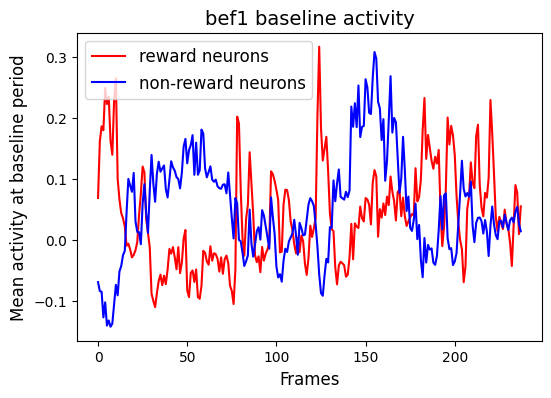

In [180]:
grayFr = (bef1_beh['ft_PosCum']/60 <52) & (bef1_beh['ft_PosCum']/60 >42) & bef1_beh['ft_trInd_even'] 
grayFr = grayFr[:bef1_spk.shape[1]] 
spkBaseline1 = bef1_spk[bef1_reg_idx['aHV']][sel_idx_stim1_all[0]][:,grayFr].mean(axis=0)
spkBaseline2 = bef1_spk[bef1_reg_idx['aHV']][sel_idx_stim2_all[0]][:,grayFr].mean(axis=0)

plt.figure(figsize=(6,4))
plt.plot(spkBaseline1, color='r', label='reward neurons')
plt.plot(spkBaseline2, color='b', label='non-reward neurons')
plt.xlabel('Frames')
plt.ylabel('Mean activity at baseline period')
plt.title('bef1 baseline activity')
plt.legend()

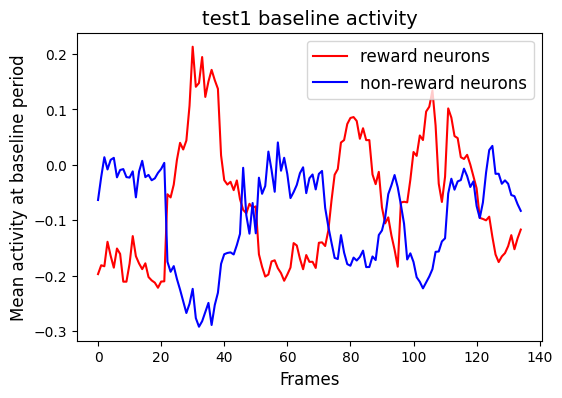

In [182]:
grayFr = (test1_beh['ft_PosCum']/60 <52) & (test1_beh['ft_PosCum']/60 >42) & test1_beh['ft_trInd_even'] 
grayFr = grayFr[:test1_spk.shape[1]] 
spkBaseline1 = test1_spk[test1_reg_idx['aHV']][sel_idx_stim1_all[2]][:,grayFr].mean(axis=0)
spkBaseline2 = test1_spk[test1_reg_idx['aHV']][sel_idx_stim2_all[2]][:,grayFr].mean(axis=0)

plt.figure(figsize=(6,4))
plt.plot(spkBaseline1, color='r', label='reward neurons')
plt.plot(spkBaseline2, color='b', label='non-reward neurons')
plt.xlabel('Frames')
plt.ylabel('Mean activity at baseline period')
plt.title('test1 baseline activity')
plt.legend()

### Fig 4i like avg firing (delta F)

have to check 1 fr is approximately how many sec

In [303]:
def spk_2_firstLick(spk_s1, spk_s2, beh, ranges=[15, 15], bins=30):
    """ranges: frames included before and after first lick
        spk: one dimensional activity
    """
    lickPos, lickFr, lickTr, ntrials  = beh['LickPos'], beh['LickFr'].astype(int), beh['LickTrind'].astype(int), beh['ntrials']
    spk2Flick_s1 = np.empty((ntrials, np.sum(ranges))) * np.nan
    spk2Flick_s2 = np.empty((ntrials, np.sum(ranges))) * np.nan
    lick2Flick = np.empty((ntrials, np.sum(ranges))) * np.nan
    Flick_pos = np.empty(ntrials) * np.nan
    for n in range(ntrials):
        idx = lickTr==n
        if idx.sum()>0:
            F_id = int(lickFr[np.where(idx)[0][0]]) # first lick frame index
            lickFr_offset = lickFr - F_id # align lick frame to first lick
            temp_spk = spk_s1[F_id - ranges[0] : F_id+ranges[1]]
            temp_spk2 = spk_s2[F_id - ranges[0] : F_id+ranges[1]]
            if len(temp_spk)>0 and len(temp_spk2)>0:
                Flick_pos[n] = lickPos[idx][0]
                spk2Flick_s1[n] = spk_s1[F_id - ranges[0] : F_id+ranges[1]]
                spk2Flick_s2[n] = spk_s2[F_id - ranges[0] : F_id+ranges[1]]
                temp_lick = lickFr_offset[(lickFr_offset>=-ranges[0]) & (lickFr_offset<=ranges[1])] + ranges[0]
                hist, edge = np.histogram(temp_lick, bins=bins, range=(0, np.sum(ranges)))
                lick2Flick[n] = hist
    return Flick_pos, spk2Flick_s1, spk2Flick_s2, lick2Flick

def spk_2_cue(spk_s1, spk_s2, beh, ranges=[15, 15], bins=30):
    """ranges: frames included before and after cue frame
        spk: one dimensional activity
    """
    SoundFr, lickFr, lickTr, ntrials, pos  = beh['SoundFr'].astype(int), beh['LickFr'].astype(int), beh['LickTrind'].astype(int), beh['ntrials'], beh['ft_PosCum']/60
    spk2Cue_s1 = np.empty((ntrials, np.sum(ranges))) * np.nan
    spk2Cue_s2 = np.empty((ntrials, np.sum(ranges))) * np.nan
    dist2Cue = np.empty((ntrials, np.sum(ranges))) * np.nan
    lick2Cue = np.empty((ntrials, np.sum(ranges))) * np.nan
    for n in range(ntrials):
        spk2Cue_s1[n] = spk_s1[SoundFr[n] - ranges[0] : SoundFr[n] + ranges[1]]
        spk2Cue_s2[n] = spk_s2[SoundFr[n] - ranges[0] : SoundFr[n] + ranges[1]]
        dist2Cue[n] = pos[SoundFr[n] - ranges[0] : SoundFr[n] + ranges[1]] - pos[SoundFr[n]]
        temp_lick = lickFr[(lickFr>=SoundFr[n]-ranges[0]) & (lickFr<=SoundFr[n]+ranges[1])] - SoundFr[n] + ranges[0]
        hist, edge = np.histogram(temp_lick, bins=bins, range=(0, np.sum(ranges)))
        lick2Cue[n] = hist
    return spk2Cue_s1, spk2Cue_s2, lick2Cue, dist2Cue


In [306]:
from math import dist


ranges = np.array([24, 24])

ntrials = aft1_beh['ntrials']
test_tr = np.arange(1, ntrials+1)%2==0 # even trials as test trials

spk2Flick1 = np.empty((ntrials, np.sum(ranges))) * np.nan
spk2Flick2 = np.empty((ntrials, np.sum(ranges))) * np.nan
lick2Flick = np.empty((ntrials, np.sum(ranges))) * np.nan
Flick_pos = np.empty(ntrials) * np.nan
spk2Cue1 = np.empty((ntrials, np.sum(ranges))) * np.nan
spk2Cue2 = np.empty((ntrials, np.sum(ranges))) * np.nan
lick2Cue = np.empty((ntrials, np.sum(ranges))) * np.nan
dist2Cue = np.empty((ntrials, np.sum(ranges))) * np.nan

Flick_pos_temp, spk2Flick_temp1, spk2Flick_temp2, lick2Flick_temp = spk_2_firstLick(aft1_spk[aft1_reg_idx['aHV']][sel_idx_stim1_all[1]].mean(0), aft1_spk[aft1_reg_idx['aHV']][sel_idx_stim2_all[1]].mean(0), aft1_beh, ranges=ranges, bins=48)
Flick_pos[test_tr] = Flick_pos_temp[test_tr]
spk2Flick1[test_tr] = spk2Flick_temp1[test_tr]
spk2Flick2[test_tr] = spk2Flick_temp2[test_tr]
lick2Flick[test_tr] = lick2Flick_temp[test_tr]

spk2Cue_temp1, spk2Cue_temp2, lick2cue_temp, dist2Cue_temp = spk_2_cue(aft1_spk[aft1_reg_idx['aHV']][sel_idx_stim1_all[1]].mean(0), aft1_spk[aft1_reg_idx['aHV']][sel_idx_stim2_all[1]].mean(0), aft1_beh, ranges=ranges, bins=48)
spk2Cue1[test_tr] = spk2Cue_temp1[test_tr]
spk2Cue2[test_tr] = spk2Cue_temp2[test_tr]
lick2Cue[test_tr] = lick2cue_temp[test_tr]    
dist2Cue[test_tr] = dist2Cue_temp[test_tr]  




In [296]:
dist2Cue[test_tr][0]

array([-0.60074757, -0.56741424, -0.55741424, -0.5240809 , -0.49558068,
       -0.46373885, -0.4506043 , -0.4340809 , -0.41741424, -0.38741424,
       -0.35741424, -0.35459395, -0.32741424, -0.29631896, -0.2644467 ,
       -0.23056313, -0.21568563, -0.18074757, -0.15074757, -0.12888252,
       -0.0967597 , -0.06478321, -0.0340809 , -0.0140809 ,  0.        ,
        0.02925243,  0.02925243,  0.02925243,  0.02925243,  0.02925243,
        0.02925243,  0.02925243,  0.02925243,  0.02925243,  0.02925243,
        0.02925243,  0.05450585,  0.08586544,  0.11925243,  0.14936471,
        0.16817387,  0.20089834,  0.23258576,  0.26258576,  0.29562509,
        0.31658415,  0.34925243,  0.3822245 ])

In [305]:
from re import A


def plot_rewResp_2_Cue_single(resp2Cue1, resp2Cue2, lick2Cue, dist2Cue, beh, baseline1, baseline2):

    stim_id, WallN, uniqWN = beh['stim_id'], beh['WallName'], beh['UniqWalls']
    rewStim = WallN==uniqWN[stim_id==2]
    resp2Cue11 = resp2Cue1[rewStim]
    resp2Cue21 = resp2Cue2[rewStim]
    lick2Cue1 = lick2Cue[rewStim]
    dist2Cue1 = dist2Cue[rewStim]

    print(lick2Cue1.shape, resp2Cue11.shape, resp2Cue21.shape)
        
    resp2Cue11 = (resp2Cue11 - np.nanmean(resp2Cue11)) / np.nanstd(resp2Cue11)
    resp2Cue21 = (resp2Cue21 - np.nanmean(resp2Cue21)) / np.nanstd(resp2Cue21)
    u_dist1 = np.nanmean(dist2Cue1, 0)
    u_spk11 = np.nanmean(resp2Cue11, 0)
    u_spk21 = np.nanmean(resp2Cue21, 0)
    u_lick1 = np.nanmean(lick2Cue1, 0) * 3 # recording frame rate is 3 Hz,
    print(u_dist1)

    baseline11 = np.ones(u_spk11.shape) * baseline1.mean()
    baseline21 = np.ones(u_spk21.shape) * baseline2.mean()

    rewStim2 = WallN==uniqWN[stim_id==0]
    resp2Cue12 = resp2Cue1[rewStim2]
    resp2Cue22 = resp2Cue2[rewStim2]
    lick2Cue2 = lick2Cue[rewStim2]
    dist2Cue2 = dist2Cue[rewStim2]
    print(lick2Cue2.shape, resp2Cue12.shape, resp2Cue22.shape)
        
    resp2Cue12 = (resp2Cue12 - np.nanmean(resp2Cue12)) / np.nanstd(resp2Cue12)
    resp2Cue22 = (resp2Cue22 - np.nanmean(resp2Cue22)) / np.nanstd(resp2Cue22)
    u_spk12 = np.nanmean(resp2Cue12, 0)
    u_spk22 = np.nanmean(resp2Cue22, 0)
    u_lick2 = np.nanmean(lick2Cue2, 0) * 3 # recording frame rate is 3 Hz,
    u_dist2 = np.nanmean(dist2Cue2, 0)
    print(u_dist2)

    baseline12 = np.ones(u_spk12.shape) * baseline1.mean()
    baseline22 = np.ones(u_spk22.shape) * baseline2.mean()
          
    fig, ax = plt.subplots(1, 2, figsize=(15, 5))
    ax[0].plot(baseline11, color='tab:red', lw=1, ls='--', label='baseline1', alpha=0.5)
    ax[0].plot(baseline21, color='tab:blue', lw=1, ls='--', label='baseline2', alpha=0.5)
    ax[0].plot(u_spk11, color='tab:red', lw=1, label='reward neurons')
    ax[0].plot(u_spk21, color='tab:blue', lw=1, label='non-reward neurons')
    ax[0].axvline(24-0.5, linewidth=0.5, linestyle=':', color='0.5')
    ax2 = ax[0].twinx()
    ax2.plot(u_lick1, color='0.5', lw=1, label='lick rate')
    ax[0].spines['top'].set_visible(False)
    ax2.spines['top'].set_visible(False)  
    ax2.spines['right'].set_visible(False)
    ax[0].set_xticks(np.arange(0, 49, 6), np.arange(-8, 9, 2))
    ax[0].legend(loc='upper left', frameon=False)
    ax2.legend(loc='upper right', frameon=False)
    ax[0].set_ylabel('average activity (zscore)')
    ax[0].set_xlabel('time to cue (s)')
    ax[0].set_title('VR2 Aft1 Leaf1 Corridors')

    ax[1].plot(baseline12, color='tab:red', lw=1, ls='--', label='baseline1', alpha=0.5)
    ax[1].plot(baseline22, color='tab:blue', lw=1, ls='--', label='baseline2', alpha=0.5)
    ax[1].plot(u_spk12, color='tab:red', lw=1, label='reward neurons')
    ax[1].plot(u_spk22, color='tab:blue', lw=1, label='non-reward neurons')
    ax[1].axvline(24-0.5, linewidth=0.5, linestyle=':', color='0.5')
    ax2 = ax[1].twinx()
    ax2.plot(u_lick2, color='0.5', lw=1, label='lick rate')
    ax[1].spines['top'].set_visible(False)
    ax2.spines['top'].set_visible(False)  
    ax[1].spines['left'].set_visible(False)
    ax[1].set_xticks(np.arange(0, 49, 6), np.arange(-8, 9, 2))
    ax2.set_ylabel('lick rate (Hz)')
    ax[1].set_xlabel('time to cue (s)')
    ax[1].set_title('VR2 Aft1 Circle1 Corridors')

    plt.show()


(234, 48) (234, 48) (234, 48)
[-0.81406069 -0.78355839 -0.75144489 -0.717628   -0.68174277 -0.64561527
 -0.60993939 -0.57349389 -0.53683266 -0.50121567 -0.46531123 -0.43089471
 -0.39656485 -0.36242536 -0.32846295 -0.29424324 -0.26102522 -0.22791654
 -0.19496803 -0.16223298 -0.13010315 -0.09738256 -0.06454571 -0.0328164
  0.          0.03402495  0.04881683  0.05060052  0.05183256  0.0530014
  0.05421049  0.05572869  0.05814214  0.06198409  0.0678471   0.07636692
  0.0881484   0.10397863  0.12324365  0.14508966  0.16976893  0.19660558
  0.22480905  0.25379076  0.28383606  0.31345551  0.3444658   0.37617946]
(236, 48) (236, 48) (236, 48)
[-0.77393984 -0.74403978 -0.71349435 -0.68147936 -0.64858152 -0.61547121
 -0.58268021 -0.54950282 -0.51673289 -0.48511329 -0.45348423 -0.42247037
 -0.3921102  -0.36234941 -0.3327156  -0.30325851 -0.27270084 -0.24104819
 -0.20859671 -0.17553428 -0.14154635 -0.10677265 -0.07200021 -0.03602309
  0.          0.0356958   0.0706437   0.10536698  0.14034613  0.1

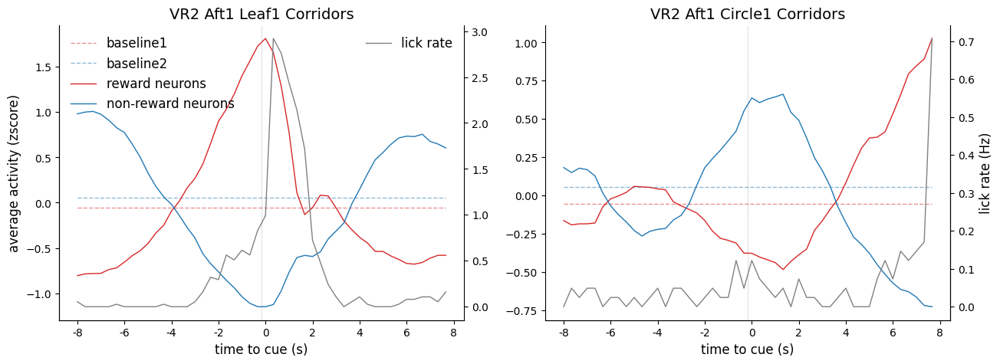

In [307]:
plot_rewResp_2_Cue_single(spk2Cue1, spk2Cue2, lick2Cue, dist2Cue, aft1_beh, spkBaseline1, spkBaseline2)

In [ ]:
def plot_rewResp_2_Cue(ax, dat):
    u_spk, u_lick = [], []
    for kn in dat:
        beh = dat[kn]['beh']
        stim_id, WallN, uniqWN = beh['stim_id'], beh['WallName'], beh['UniqWalls']
        rewStim = WallN==uniqWN[stim_id==2]
        resp2Cue = dat[kn]['resp2Cue'][rewStim]
        lick2Cue = dat[kn]['lick2Cue'][rewStim]
        
        resp2Cue = (resp2Cue - np.nanmean(resp2Cue)) / np.nanstd(resp2Cue)
        u_spk.append(np.nanmean(resp2Cue, 0))
        u_lick.append(lick2Cue.mean(0) * 3) # recording frame rate is 3 Hz,
        
    u_spk = np.array(u_spk)
    u_lick = np.array(u_lick)
    u0, sem0 = np.nanmean(u_spk, 0), np.nanstd(u_spk, 0, ddof=1)/np.sqrt(u_spk.shape[0])
    u1, sem1 = u_lick.mean(0), u_lick.std(0, ddof=1)/np.sqrt(u_lick.shape[0])    
    ax.plot(u0, color='b', lw=1)
    ax.fill_between(np.arange(len(u0)), u0-sem0, u0+sem0, color='b', alpha=0.3, edgecolor='None')
    ax.axvline(15-0.5, linewidth=0.5, linestyle=':', color='0.5')
    ax2 = ax.twinx()
    ax2.plot(u1, color='0.5', lw=1)
    ax2.fill_between(np.arange(len(u1)), u1-sem1, u1+sem1, color='0.5', alpha=0.3, edgecolor='None')
    utils.fmt(ax, ylabel='average activity (zscore)', boxoff=0, ylm=[-0.7,2], xlabel='time to cue (s)', 
              xtick=[np.linspace(0,30,11)[1::2]-0.5,np.linspace(0,10,11)[1::2].astype(int)-5], xlm=[-0.5, len(u0)-0.5])
    utils.fmt(ax2, ylabel='lick rate (counts/s)', boxoff=0, ylm=[-0.3, 3.7])
    ax.spines['top'].set_visible(False)
    ax2.spines['top'].set_visible(False)  


def plot_rewResp_2_firstLick(ax, dat):
    u_spk, u_lick = [], []
    for kn in dat:
        beh = dat[kn]['beh']
        stim_id, WallN, uniqWN = beh['stim_id'], beh['WallName'], beh['UniqWalls']
        rewStim = WallN==uniqWN[stim_id==2]

        late_FL = dat[kn]['FL_pos']>=20
        resp2FL = dat[kn]['resp2FL'][rewStim & late_FL]
        lick2FL = dat[kn]['lick2FL'][rewStim & late_FL]
        if resp2FL.shape[0]>10:
#             print(resp2FL.shape)
            resp2FL = (resp2FL - resp2FL.mean()) / resp2FL.std()
            u_spk.append(resp2FL.mean(0))
            u_lick.append(lick2FL.mean(0)  * 3)
    u_spk = np.array(u_spk)
    u_lick = np.array(u_lick)
    u0, sem0 = u_spk.mean(0), u_spk.std(0, ddof=1)/np.sqrt(u_spk.shape[0])
    u1, sem1 = u_lick.mean(0), u_lick.std(0, ddof=1)/np.sqrt(u_lick.shape[0])    
    ax.plot(u0, color='b', lw=1)
    ax.fill_between(np.arange(len(u0)), u0-sem0, u0+sem0, color='b', alpha=0.3, edgecolor='None')
    ax2 = ax.twinx()
    ax2.plot(u1, color='0.5', lw=1)
    ax2.fill_between(np.arange(len(u1)), u1-sem1, u1+sem1, color='0.5', alpha=0.3, edgecolor='None')
    utils.fmt(ax, ylabel='average activity (zscore)', boxoff=0, ylm=[-0.8, 1.3], ytick=[[0, 1, 2]], xlabel='time to first lick (s)',
              xtick=[np.linspace(0,30,11)[1::2]-0.5,np.linspace(0,10,11)[1::2].astype(int)-5], xlm=[-0.5, len(u0)-0.5])
    utils.fmt(ax2, ylabel='lick rate (counts/s)', boxoff=0, ylm=[-0.2, 4.5])
    ax.spines['top'].set_visible(False)
    ax2.spines['top'].set_visible(False)    



In [328]:
def normalization1(trial_pos, leaf_idx, circle_idx):
    """ mu: gray space mean activity as baseline
        std: stim1/2 + stim2/2
     """
    nneu, _, _= trial_pos.shape         
    # beh variables

    spk_resh = trial_pos.reshape((nneu,-1))

    corr_spk = trial_pos[:, :, :40].copy() # get activity in the texture area 
    eps = 1e-8
    # use nanmean/nanstd to tolerate NaNs
    u0 = np.nanmean(trial_pos[:, :, 42:52].reshape(nneu, -1), axis=1, keepdims=True)
    stim1_std = np.nanstd(corr_spk[:, :leaf_idx].reshape(nneu, -1),  axis=1, keepdims=True)
    stim2_std = np.nanstd(corr_spk[:, leaf_idx:(leaf_idx+circle_idx)].reshape(nneu, -1), axis=1, keepdims=True)
    den = stim1_std + stim2_std
    den = np.where(np.isfinite(den) & (den > 0), den, eps)
    spk_norm = (2 * (spk_resh - u0) / den).reshape(trial_pos.shape)

    #print('done normalization..')
    
    return spk_norm

plt.rcParams.update({
    "font.size": 12, # base font ~18
    "axes.titlesize": 14, # subplot title
    "axes.labelsize": 12,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10
})

from matplotlib.patches import Patch
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

def _label_col_rgb(sel1_bool, sel2_bool):
    """
    sel1_bool, sel2_bool: boolean arrays of shape (N,)
    Returns an (N, 1, 3) float RGB array:
      gray = non-selective
      green = stim1
      orange = stim2
      black = both (if that can happen)
    """
    N = sel1_bool.size
    col = np.full((N, 1, 3), 0.85, float)  # light gray
    only1 = sel1_bool 
    only2 = sel2_bool
    col[only1, 0, :] = (0.0, 0.6, 0.0)     # green
    col[only2, 0, :] = (1.0, 0.5, 0.0)     # orange
    return col

# (Optional) legend handles you can reuse
label_handles = [
    Patch(facecolor=(0.0, 0.6, 0.0), edgecolor='none', label='stim1 selective'),
    Patch(facecolor=(1.0, 0.5, 0.0), edgecolor='none', label='stim2 selective'),
    Patch(facecolor=(0.85, 0.85, 0.85), edgecolor='none', label='non-selective'),
]


def im_plot_single(ax, mat_odd, mat_even, sel_ind1, sel_ind2, sort_fo=1, vlim=0.2):
    spk_in_fo1 = np.nansum(mat_odd[:, :40], axis=1)   # first criterion
    #spk_in_fo2 = -np.nansum(mat_odd[:, 40:], axis=1)   # second criterion

    if sort_fo:
        # Sort first by spk_in_fo1, then by spk_in_fo2
        #sort_ind = np.lexsort((spk_in_fo2, spk_in_fo1))
        sort_ind = np.argsort(spk_in_fo1) if sort_fo else np.arange(mat_odd.shape[0]).astype(int)
    else:
        sort_ind = np.arange(mat_odd.shape[0])

    im = ax.imshow(mat_even[sort_ind], cmap='RdBu_r', vmin=-vlim, vmax=vlim, aspect='auto')

    print(sort_ind.shape, sel_ind1.shape, sel_ind2.shape)

    col_sorted = _label_col_rgb(sel_ind1[sort_ind], sel_ind2[sort_ind])  # (N,1,3)

    # a very thin inset axis on the left margin of the heatmap
    # [x0, y0, width, height] are in axes-fraction coordinates
    ax_lab = inset_axes(ax, width="5%", height="100%", loc='lower left',
                            #bbox_to_anchor=(-0.035, 0, 0.02, 1.0),  # tweak left offset/width if needed
                            #bbox_transform=ax.transAxes, 
                            borderpad=0)

    ax_lab.imshow(col_sorted, aspect='auto', origin='upper')
    ax_lab.set_xticks([]); ax_lab.set_yticks([])
    for s in ax_lab.spines.values():
        s.set_visible(False)

    P = mat_even.shape[1]
    if P > 40:
        ax.vlines(40, *ax.get_ylim(), color='k', ls='dashed', lw=1.0)

    p5_idx = int(0.05 * mat_even.shape[0])
    p95_idx = int(0.95 * mat_even.shape[0])

    ax.hlines(p5_idx, *ax.get_xlim(), color='k', ls='dashed', lw=1.0)
    ax.hlines(p95_idx, *ax.get_xlim(), color='k', ls='dashed', lw=1.0)

    ax.set_aspect('auto')
    ax.set_xlabel('position (m)') if ax.get_subplotspec().is_last_row() else None

    xticks, xticklabels = [], []
    for pos_bin, label in zip([0, 20, 40, 60], [0, 2, 4, 6]):
        if pos_bin < P:
            xticks.append(pos_bin)
            xticklabels.append(label)
    ax.set_xticks(xticks, xticklabels)

    for spine in ax.spines.values():
        spine.set_linewidth(1.2)

    return im, sort_ind

def get_wall(trial_pos_block, beh, stim_id):
    wall_key = beh['UniqWalls'][beh['stim_id'] == stim_id][0]
    return trial_pos_block[wall_key]

def compute_diff_with_dprime(trial_pos, beh, reg_idx, early_frac=0.1):
    # zscore
    leaf_raw = get_wall(trial_pos, beh, stim_id=2)[reg_idx]
    circle_raw = get_wall(trial_pos, beh, stim_id=0)[reg_idx]
    tp = np.concatenate([leaf_raw, circle_raw], axis=1)
    leaf_idx = leaf_raw.shape[1]
    circle_idx = circle_raw.shape[1]
    leaf = np.zeros(leaf_raw.shape)
    circle = np.zeros(circle_raw.shape)
    del leaf_raw, circle_raw
    N, T, P = tp.shape
    step_size = 2000 # decrease this if has small RAM
    i=0    
    while i <= N:
        #Ni = tp[i:i+step_size,:,:].shape[0]
        #tpi = tp[i:i+step_size,:,:].reshape(Ni, -1)
        #tpz = zscore(tpi, axis=1, nan_policy='omit')
        print(tp[i:i+step_size,:,:].shape)
        tpz = normalization1(tp[i:i+step_size,:,:], leaf_idx, circle_idx)
        #tpz = tpz.reshape(Ni, T, P)
        leaf[i:i+step_size,:,:] = tpz[:,:leaf_idx,:]
        circle[i:i+step_size,:,:] = tpz[:,leaf_idx:(circle_idx+leaf_idx),:]
        print(i) 
        i += step_size
    
    del tp, tpz


    n_trials = beh['ntrials']  
    uniqW, WallN = beh['UniqWalls'], beh['WallName']
    stim_id = beh['stim_id']
    stim1 = WallN==uniqW[stim_id==2]
    stim2 = WallN==uniqW[stim_id==0]
    iseven_global = np.arange(n_trials) % 2 == 0
    isodd_global = np.arange(n_trials) % 2 == 1

    stim1_idx = np.flatnonzero(stim1) # global -> local mapping   
    stim2_idx = np.flatnonzero(stim2)          
    leaf_even = iseven_global[stim1_idx]   
    circle_even = iseven_global[stim2_idx] 
    leaf_odd = isodd_global[stim1_idx]
    circle_odd = isodd_global[stim2_idx]

    T_leaf = leaf.shape[1]
    T_circle = circle.shape[1]
    Te_leaf = max(1, int(np.floor(early_frac * T_leaf)))
    Te_circle = max(1, int(np.floor(early_frac * T_circle)))
    print(Te_leaf, Te_circle)
    Te_leaf_odd = np.where(leaf_odd)[0][:Te_leaf]
    Te_leaf_even = np.where(leaf_even)[0][:Te_leaf]
    Te_circle_odd = np.where(circle_odd)[0][:Te_circle]
    Te_circle_even = np.where(circle_even)[0][:Te_circle]

    early_leaf_odd = np.nanmean(leaf[:, Te_leaf_odd, :], axis=1)
    early_leaf_even = np.nanmean(leaf[:, Te_leaf_even, :], axis=1)
    early_circle_odd = np.nanmean(circle[:, Te_circle_odd, :], axis=1)
    early_circle_even = np.nanmean(circle[:, Te_circle_even, :], axis=1)
    early_diff_odd = early_leaf_odd - early_circle_odd
    early_diff_even = early_leaf_even - early_circle_even

    all_leaf_odd = np.nanmean(leaf[:, leaf_odd, :], axis=1)
    all_leaf_even = np.nanmean(leaf[:, leaf_even, :], axis=1)
    all_circle_odd = np.nanmean(circle[:, circle_odd, :], axis=1)
    all_circle_even = np.nanmean(circle[:, circle_even, :], axis=1)
    all_diff_odd = all_leaf_odd - all_circle_odd
    all_diff_even = all_leaf_even - all_circle_even

    #return early_diff_odd, early_diff_even, all_diff_odd, all_diff_even, (dp0, dp1, dp2)
    return early_diff_odd, early_diff_even, all_diff_odd, all_diff_even


regions = ['All', 'V1', 'mHV', 'lHV', 'aHV']  

def draw_grid(col_specs, sel_ind1, sel_ind2, title, vlim=0.2, early_frac=0.1, sort_fo=1):
    nrows = len(regions) * 2 # early + all per region
    ncols = 3 # bef1, aft1, test1

    fig, axes = plt.subplots(nrows, ncols, figsize=(8, 32))
    fig.subplots_adjust(wspace=0.6, hspace=0.2)  

    last_im = None
    sort_ind_regions = {k: [] for k in regions}
    #dp0_regions = {k: [] for k in regions}
    #dp1_regions = {k: [] for k in regions}
    #dp2_regions = {k: [] for k in regions}
    for r, region in enumerate(regions):
        print(region)
        r_early = 2*r
        r_all = 2*r + 1

        sel_ind1_reg = sel_ind1[region]
        sel_ind2_reg = sel_ind2[region]

        for c, (col_title, trial_pos_name, beh_name, reg_idx_name) in enumerate(col_specs):
            trial_pos = globals()[trial_pos_name]
            beh = globals()[beh_name]
            reg_idx = globals()[reg_idx_name]

            sel_ind1_session = sel_ind1_reg[c]
            sel_ind2_session = sel_ind2_reg[c]

            #early_diff_odd, early_diff_even, all_diff_odd, all_diff_even, (dp0, dp1, dp2) = compute_diff_with_dprime(trial_pos, beh, reg_idx[region], early_frac=early_frac)
            early_diff_odd, early_diff_even, all_diff_odd, all_diff_even = compute_diff_with_dprime(trial_pos, beh, reg_idx[region], early_frac=early_frac)
            
            ax_e = axes[r_early, c]
            last_im, _ = im_plot_single(ax_e, early_diff_odd, early_diff_even, sel_ind1_session, sel_ind2_session, sort_fo=sort_fo, vlim=vlim)
            if r == 0:  
                ax_e.set_title(col_title)
            if c == 0:  
                ax_e.set_ylabel(f'{region}_early trials')

            ax_a = axes[r_all, c]
            last_im, sort_ind = im_plot_single(ax_a, all_diff_odd, all_diff_even, sel_ind1_session, sel_ind2_session, sort_fo=sort_fo, vlim=vlim)
            sort_ind_regions[region].append(sort_ind)
            #dp0_regions[region].append(dp0)
            #dp1_regions[region].append(dp1)
            #dp2_regions[region].append(dp2)
            if c == 0:
               ax_a.set_ylabel(f'{region}_all trials')

    # Shared colorbar on the right
    cbar = fig.colorbar(last_im, ax=axes.ravel().tolist(), orientation='vertical', fraction=0.02, pad=0.02)

    fig.suptitle(title, fontsize=16, y=0.9)
    plt.show()
    #plt.savefig(os.path.join(root2, 'fig', f'{title.replace(" ", "_").lower()}.png'), dpi=600, bbox_inches="tight")
    plt.close(fig)
    #return sort_ind_regions, dp0_regions, dp1_regions, dp2_regions
    return sort_ind_regions

All
(2000, 348, 60)
0
(2000, 348, 60)
2000
(2000, 348, 60)
4000
(2000, 348, 60)
6000
(2000, 348, 60)
8000
(2000, 348, 60)
10000
(2000, 348, 60)
12000
(2000, 348, 60)
14000
(2000, 348, 60)
16000
(2000, 348, 60)
18000
(2000, 348, 60)
20000
(2000, 348, 60)
22000
(2000, 348, 60)
24000
(2000, 348, 60)
26000
(2000, 348, 60)
28000
(2000, 348, 60)
30000
(2000, 348, 60)
32000
(2000, 348, 60)
34000
(2000, 348, 60)
36000
(2000, 348, 60)
38000
(2000, 348, 60)
40000
(2000, 348, 60)
42000
(2000, 348, 60)
44000
(2000, 348, 60)
46000
(2000, 348, 60)
48000
(2000, 348, 60)
50000
(2000, 348, 60)
52000
(2000, 348, 60)
54000
(2000, 348, 60)
56000
(2000, 348, 60)
58000
(2000, 348, 60)
60000
(2000, 348, 60)
62000
(2000, 348, 60)
64000
(2000, 348, 60)
66000
(2000, 348, 60)
68000
(2000, 348, 60)
70000
(2000, 348, 60)
72000
(2000, 348, 60)
74000
(2000, 348, 60)
76000
(2000, 348, 60)
78000
(1473, 348, 60)
80000
17 17
(81473,) (81473,) (81473,)
(81473,) (81473,) (81473,)
(2000, 470, 60)
0
(2000, 470, 60)
2000
(20

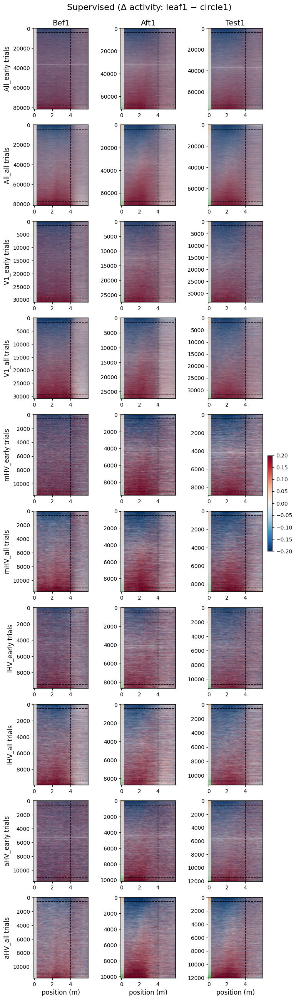

In [329]:
# SUP (10 x 3)
sup_cols = [
    ('Bef1',  'bef1_trial_pos',  'bef1_beh', 'bef1_reg_idx'),
    ('Aft1',  'aft1_trial_pos',  'aft1_beh', 'aft1_reg_idx'),
    ('Test1', 'test1_trial_pos', 'test1_beh', 'test1_reg_idx'),
]
#stim1_neuron2_region = draw_grid2(sup_cols, title='Supervised (Δ activity: leaf1 − circle1)', vlim=0.2, early_frac=0.1, sort_fo=1)
#sort_ind_regions, dp0_regions, dp1_regions, dp2_regions = draw_grid(sup_cols, title='Supervised (Δ activity: leaf1 − circle1)', vlim=0.2, early_frac=0.1, sort_fo=1)
sort_ind_regions = draw_grid(sup_cols, sel_idx_stim1_all, sel_idx_stim2_all, title='Supervised (Δ activity: leaf1 − circle1)', vlim=0.2, early_frac=0.1, sort_fo=1)

In [ ]:
def normalization2(trial_pos, leaf_idx, circle_idx):
    """ mu: gray space mean activity as baseline
        std: stim1/2 + stim2/2
     """
    nneu, ntr, _= trial_pos.shape         
    # beh variables

    spk_resh = trial_pos[:,:,:40].reshape((nneu,-1))

    corr_spk = trial_pos[:, :, :40].copy() # get activity in the texture area

    eps = 1e-8
    # use nanmean/nanstd to tolerate NaNs
    u0 = np.nanmean(trial_pos[:, :, 42:52].reshape(nneu, -1), axis=1, keepdims=True)
    spk_centered = spk_resh - u0

    stim1_std = np.nanstd(corr_spk[:, :leaf_idx].reshape(nneu, -1),  axis=1, keepdims=True)
    stim2_std = np.nanstd(corr_spk[:, leaf_idx:(leaf_idx+circle_idx)].reshape(nneu, -1), axis=1, keepdims=True)
    den = stim1_std + stim2_std
    den = np.where(np.isfinite(den) & (den > 0), den, eps)
    spk_norm = 1 / (1 + np.exp(-2*spk_centered/den)).reshape(nneu, ntr, 40)
    #print('done normalization..')
    
    return spk_norm


def trial_pos_zscore(trial_pos, beh, reg_idx):
    leaf_raw = get_wall(trial_pos, beh, stim_id=2)[reg_idx]
    circle_raw = get_wall(trial_pos, beh, stim_id=0)[reg_idx]
    tp = np.concatenate([leaf_raw, circle_raw], axis=1)
    leaf_idx = leaf_raw.shape[1]
    circle_idx = circle_raw.shape[1]
    leaf = np.zeros(leaf_raw.shape)
    circle = np.zeros(circle_raw.shape)
    del leaf_raw, circle_raw
    N, T, P = tp.shape
    step_size = 2000 # decrease this if has small RAM
    i=0    
    while i <= N:
        Ni = tp[i:i+step_size,:,:].shape[0]
        tpi = tp[i:i+step_size,:,:].reshape(Ni, -1)
        tpz = zscore(tpi, axis=1, nan_policy='omit')
        #print(tp[i:i+step_size,:,:].shape)
        #tpz = normalization1(tp[i:i+step_size,:,:], leaf_idx, circle_idx)
        tpz = tpz.reshape(Ni, T, P)
        leaf[i:i+step_size,:,:] = tpz[:,:leaf_idx,:]
        circle[i:i+step_size,:,:] = tpz[:,leaf_idx:(circle_idx+leaf_idx),:]
        print(i) 
        i += step_size
    del tp, tpz  

    trial_pos = {}
    trial_pos[beh['UniqWalls'][beh['stim_id'] == 2][0]] = leaf
    trial_pos[beh['UniqWalls'][beh['stim_id'] == 0][0]] = circle
    
    return trial_pos 